# پرسش یک


In [ ]:
!pip install scikit-fuzzy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 5.3 MB/s eta 0:00:00


Predicted output for x=0.5: 0.6705258012728662


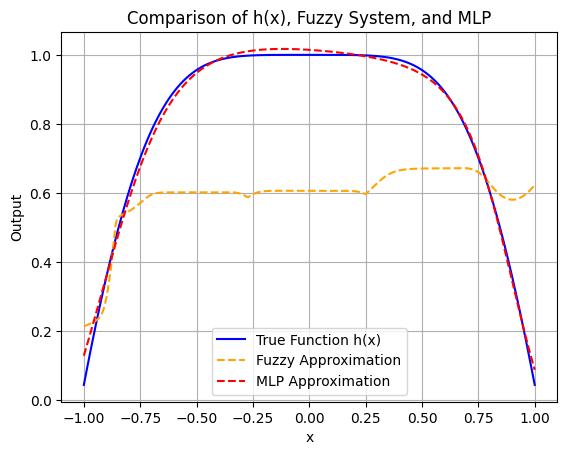

MSE (Fuzzy System): 0.09557
MSE (MLP Model): 0.00028

Defuzzifier Comparison:
Defuzzifier = centroid   → MSE = 0.09557
Defuzzifier = bisector   → MSE = 0.09287
Defuzzifier = mom        → MSE = 0.07139

✅ Best Defuzzifier based on MSE: **MOM** (MSE = 0.07139)


In [ ]:
#  کتابخانه‌ها
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import torch
import torch.nn as nn
import skfuzzy as fuzz
from skfuzzy import control as ctrl

# تولید داده‌ها
x_vals = np.linspace(-1, 1, 300)
y_vals = np.exp(-np.pi * x_vals**2) + x_vals * np.sin(np.pi * x_vals)


# تعریف سیستم فازی
x_input = ctrl.Antecedent(np.linspace(-1, 1, 300), 'x')
y_output = ctrl.Consequent(np.linspace(min(y_vals), max(y_vals), 300), 'y')

# مقادیر آماری خروجی
y_min, y_med, y_max = np.min(y_vals), np.median(y_vals), np.max(y_vals)


# # تعریف ۵ مجموعه bell برای x_input:
x_input['very_low']  = fuzz.gbellmf(x_input.universe, 0.1, 3, -1.0)
x_input['low']       = fuzz.gbellmf(x_input.universe, 0.25, 3, -0.5)
x_input['medium']    = fuzz.gbellmf(x_input.universe, 0.3, 3, 0.0)
x_input['high']      = fuzz.gbellmf(x_input.universe, 0.3, 3, 0.5)
x_input['very_high'] = fuzz.gbellmf(x_input.universe, 0.3, 3, 1.0)



# تعریف 5 مجموعه فازی برای خروجی y
y_output['very_low']  = fuzz.trimf(y_output.universe, [y_min, y_min, y_min + (y_med - y_min)/2])
y_output['low']       = fuzz.trimf(y_output.universe, [y_min, y_min + (y_med - y_min)/2, y_med])
y_output['medium']    = fuzz.trimf(y_output.universe, [y_min, y_med, y_max])
y_output['high']      = fuzz.trimf(y_output.universe, [y_med, y_max - (y_max - y_med)/2, y_max])
y_output['very_high'] = fuzz.trimf(y_output.universe, [y_max - (y_max - y_med)/2, y_max, y_max])

# تعریف قوانین فازی بیشتر (5 قانون)
rules = [
    ctrl.Rule(x_input['very_low'], y_output['very_low']),
    ctrl.Rule(x_input['low'] | x_input['medium'], y_output['low']),
    ctrl.Rule(x_input['medium'] | x_input['high'], y_output['high']),
    ctrl.Rule(x_input['low'] | x_input['medium'] | x_input['high'], y_output['medium']),
    ctrl.Rule(x_input['very_high'], y_output['very_high'])
]


# ساخت سیستم فازی
system = ctrl.ControlSystem(rules)
simulation = ctrl.ControlSystemSimulation(system)

#  پیش‌بینی نقطه‌ای برای x = 0.5
try:
    simulation.input['x'] = 0.5
    simulation.compute()
    predicted_point = simulation.output['y']
    print(f"Predicted output for x=0.5: {predicted_point}")
except Exception as e:
    predicted_point = np.nan
    print(f"Error at x=0.5: {e}")

#  اجرای سیستم فازی برای کل داده‌ها
predicted_outputs = []

for x_val in x_vals:
    try:
        simulation.input['x'] = x_val
        simulation.compute()
        predicted_outputs.append(simulation.output['y'])
    except Exception as e:
        print(f"Error at x = {x_val}: {e}")
        predicted_outputs.append(np.nan)

predicted_outputs = np.array(predicted_outputs)

#  تعریف و آموزش مدل MLP
class MLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.hidden = nn.Sequential(
            nn.Linear(1, 16),
            nn.Tanh(),
            nn.Linear(16, 16),
            nn.Tanh(),
            nn.Linear(16, 1)
        )
    def forward(self, x):
        return self.hidden(x)

# آماده‌سازی داده‌ها برای PyTorch
x_tensor = torch.tensor(x_vals, dtype=torch.float32).view(-1, 1)
y_tensor = torch.tensor(y_vals, dtype=torch.float32).view(-1, 1)

# آموزش مدل
model = MLP()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

for epoch in range(500):
    optimizer.zero_grad()
    y_pred = model(x_tensor)
    loss = criterion(y_pred, y_tensor)
    loss.backward()
    optimizer.step()

# پیش‌بینی با MLP
y_pred_mlp = model(x_tensor).detach().numpy()

#رسم نمودار
plt.plot(x_vals, y_vals, label='True Function h(x)', color='blue')
plt.plot(x_vals, predicted_outputs, '--', label='Fuzzy Approximation', color='orange')
plt.plot(x_vals, y_pred_mlp, '--', label='MLP Approximation', color='red')
plt.legend()
plt.xlabel('x')
plt.ylabel('Output')
plt.title('Comparison of h(x), Fuzzy System, and MLP')
plt.grid(True)
plt.show()

#محاسبه خطای میانگین مربعات
valid_indices = ~np.isnan(predicted_outputs)
mse_fuzzy = mean_squared_error(y_vals[valid_indices], predicted_outputs[valid_indices])
mse_mlp = mean_squared_error(y_vals, y_pred_mlp)

print(f"MSE (Fuzzy System): {mse_fuzzy:.5f}")
print(f"MSE (MLP Model): {mse_mlp:.5f}")




#  مقایسه defuzzifierهای مختلف
print("\nDefuzzifier Comparison:")
defuzz_methods = ['centroid', 'bisector', 'mom']
mse_list = []

for method in defuzz_methods:
    # تعریف مجدد خروجی با defuzzifier جدید
    y_output.defuzzify_method = method

    # ساخت مجدد سیستم و شبیه‌سازی
    system = ctrl.ControlSystem(rules)
    simulation = ctrl.ControlSystemSimulation(system)

    fuzzy_outputs = []
    for x_val in x_vals:
        try:
            simulation.input['x'] = x_val
            simulation.compute()
            fuzzy_outputs.append(simulation.output['y'])
        except:
            fuzzy_outputs.append(np.nan)

    fuzzy_outputs = np.array(fuzzy_outputs)
    valid = ~np.isnan(fuzzy_outputs)
    mse = mean_squared_error(y_vals[valid], fuzzy_outputs[valid])
    mse_list.append(mse)
    print(f"Defuzzifier = {method:<10} → MSE = {mse:.5f}")

#  بهترین defuzzifier
best_index = np.argmin(mse_list)
best_method = defuzz_methods[best_index]
print(f"\n✅ Best Defuzzifier based on MSE: **{best_method.upper()}** (MSE = {mse_list[best_index]:.5f})")



# پرسش دو

Max error (1st order): 0.01793478260869552
Max error (2nd order): 0.01793478260869552


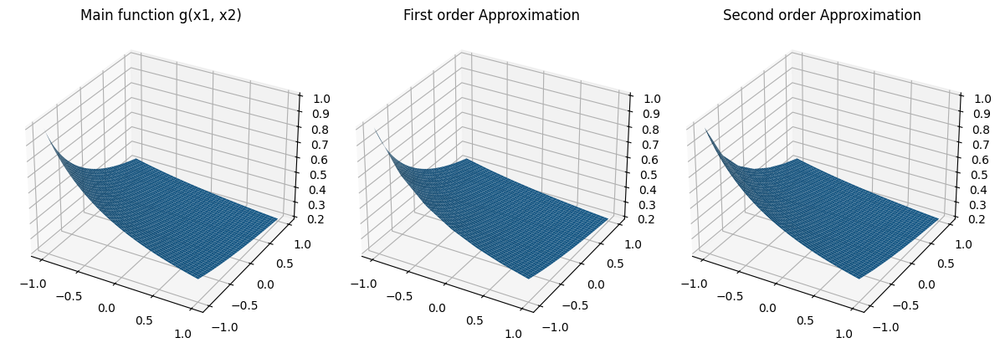

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# تعریف تابع هدف
def g(x1, x2):
    return 1.0 / (3 + x1 + x2)

# تابع عضویت مثلثی ساده
def tri_mf(x, center, width):
    return np.maximum(1 - abs(x - center) / width, 0)

# ساخت شبکه‌ی نقاط (41×41)
xs = np.linspace(-1, 1, 41)
ys = np.linspace(-1, 1, 41)

# تنظیم فازی
N = 7
centers = np.linspace(-1, 1, N)
width = 2.0 / (N - 1)

# محاسبه مقدار واقعی تابع
G_true = np.zeros((len(xs), len(ys)))
for i in range(len(xs)):
    for j in range(len(ys)):
        G_true[i, j] = g(xs[i], ys[j])

# تقریب کران مرتبه اول (فازی روی x1)
G1 = np.zeros_like(G_true)
for j in range(len(ys)):
    y = ys[j]
    samp = [g(c, y) for c in centers]
    for i in range(len(xs)):
        x = xs[i]
        mus = [tri_mf(x, c, width) for c in centers]
        num = sum(mus[k] * samp[k] for k in range(N))
        den = sum(mus)
        G1[i, j] = num / den if den != 0 else 0

# تقریب کران مرتبه دوم (فازی روی x2)
G2 = np.zeros_like(G_true)
for i in range(len(xs)):
    x = xs[i]
    samp = [g(x, c) for c in centers]
    for j in range(len(ys)):
        y = ys[j]
        mus = [tri_mf(y, c, width) for c in centers]
        num = sum(mus[k] * samp[k] for k in range(N))
        den = sum(mus)
        G2[i, j] = num / den if den != 0 else 0

# محاسبه بیشینه خطا
err1 = np.max(np.abs(G_true - G1))
err2 = np.max(np.abs(G_true - G2))
print("Max error (1st order):", err1)
print("Max error (2nd order):", err2)

# رسم سطوح
fig = plt.figure(figsize=(12, 4))
X, Y = np.meshgrid(xs, ys)

ax1 = fig.add_subplot(131, projection='3d')
ax1.plot_surface(X, Y, G_true.T)
ax1.set_title('Main function g(x1, x2)')

ax2 = fig.add_subplot(132, projection='3d')
ax2.plot_surface(X, Y, G1.T)
ax2.set_title('First order Approximation')

ax3 = fig.add_subplot(133, projection='3d')
ax3.plot_surface(X, Y, G2.T)
ax3.set_title('Second order Approximation')

plt.tight_layout()
plt.show()


# پرسش سه

Test MSE: 0.0011


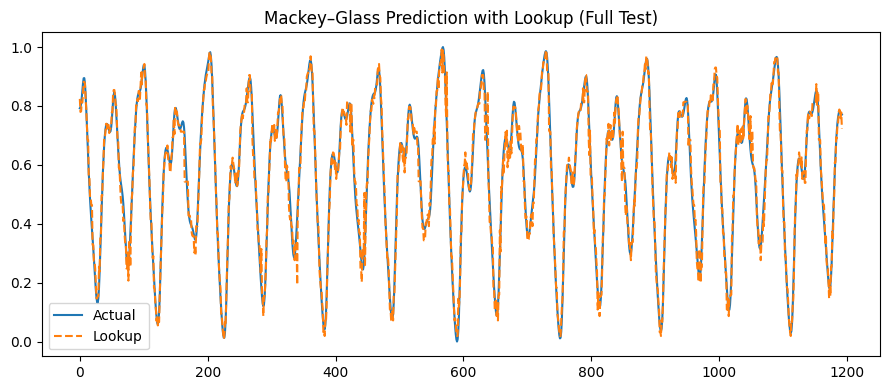

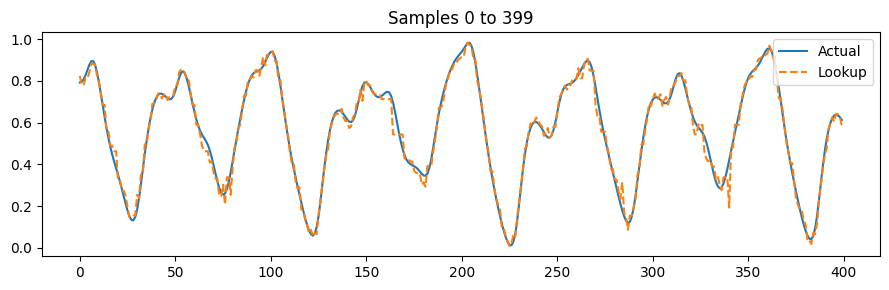

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from sklearn.metrics import mean_squared_error  # فقط برای ارزیابی

BINS       = 10      # تعداد باین در هر بعد
TRAIN_FRAC = 0.7     # نسبت آموزش
H          = 1       # گام حل معادله
LENGTH     = 4000    # طول سری زمانی

# پارامترهای بخش نمودارهای زوم
STEP    = 1200       # فاصله‌ی میان دو پنجرهٔ زوم
SEG_LEN = 400        # طول هر پنجره (۴۰۰ نمونه)

#  مولد سری Mackey–Glass
def mackey_glass(beta=0.2, gamma=0.1, n=10, tau=17,
                 h=H, length=LENGTH, x0=1.2):
    """Simple discrete-time solver for the Mackey-Glass delay differential equation with step h."""
    delay = int(tau / h)
    x = x0 * np.ones(length + delay)
    for k in range(delay, length + delay - 1):
        x[k+1] = x[k] + h * (
            beta * x[k-delay] / (1 + x[k-delay]**n) - gamma * x[k]
        )
    return x[delay:]  # حذف بخش اولیه

# آماده‌سازی داده
ts = mackey_glass()
ts = (ts - ts.min()) / (ts.max() - ts.min())  # نرمال‌سازی به [0,1]

# ورودی‌ها: x(k), x(k-6), x(k-12), x(k-18)  → هدف: x(k+6)
max_k = len(ts) - 24
X = np.column_stack([
    ts[18:max_k+18], ts[12:max_k+12],
    ts[6:max_k+6],   ts[:max_k]
])
y = ts[24:]

split = int(TRAIN_FRAC * len(X))
X_tr, X_te = X[:split], X[split:]
y_tr, y_te = y[:split], y[split:]

# ساخت جدول جستجو
edges  = np.linspace(0, 1, BINS + 1)
to_idx = lambda v: tuple(np.searchsorted(edges, v, side='right') - 1)

table = {}
for x_vec, target in zip(X_tr, y_tr):
    table.setdefault(to_idx(x_vec), []).append(target)

lookup = {cell: np.mean(vals) for cell, vals in table.items()}

#  تابع تقریب خانهٔ خالی
def get_value(cell, max_r=4):
    if cell in lookup:
        return lookup[cell]
    for r in range(1, max_r + 1):
        for delta in product(range(-r, r+1), repeat=4):
            nb = tuple(
                np.clip(c + d, 0, BINS - 1)
                for c, d in zip(cell, delta)
            )
            if nb in lookup:
                return lookup[nb]
    return 0.5  # مقدار پیش‌فرض هنگام یافت‌نشدن همسایه

#  پیش‌بینی و ارزیابی
y_pred = np.array([get_value(to_idx(x)) for x in X_te])
print(f"Test MSE: {mean_squared_error(y_te, y_pred):.4f}")

# نمودار سراسری
plt.figure(figsize=(9,4))
plt.plot(y_te, label='Actual')
plt.plot(y_pred, '--', label='Lookup')
plt.title('Mackey–Glass Prediction with Lookup (Full Test)')
plt.legend()
plt.tight_layout()
plt.show()

# پنجره‌های ۴۰۰تایی پس از هر ۱۲۰۰ نمونه
for start in range(0, len(y_te) - SEG_LEN + 1, STEP):
    end = start + SEG_LEN
    plt.figure(figsize=(9,3))
    plt.plot(range(start, end), y_te[start:end], label='Actual')
    plt.plot(range(start, end), y_pred[start:end], '--', label='Lookup')
    plt.title(f'Samples {start} to {end-1}')
    plt.legend()
    plt.tight_layout()
    plt.show()


# پرسش چهار

Primary model   MSE on test set : 1.186135e-02
Advanced model  MSE on test set : 1.463338e-03


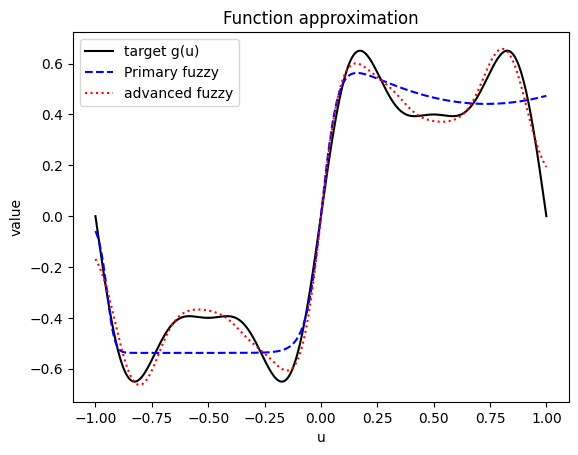

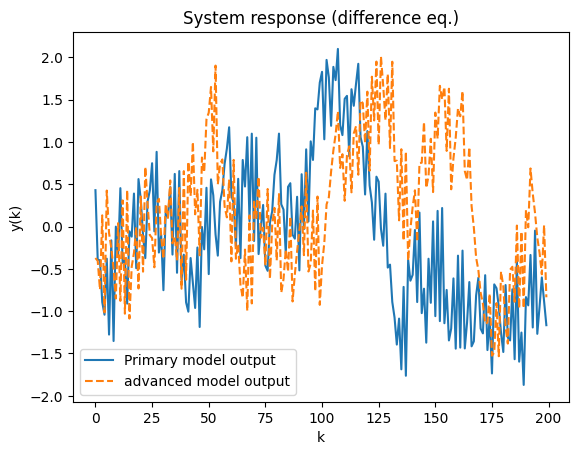

In [ ]:
#Q4: Fuzzy Approximation & System Simulation ---
import numpy as np
import matplotlib.pyplot as plt

#  1.  Target nonlinear element g(u)
def g(u):
    """The unknown nonlinear function we want to approximate."""
    return (0.6 * np.sin(np.pi * u) +
            0.3 * np.sin(3 * np.pi * u) +
            0.1 * np.sin(5 * np.pi * u))

# 2.  Create training / test data
np.random.seed(42)
N_train, N_test = 500, 200
u_train = np.random.uniform(-1, 1, N_train)
u_test  = np.random.uniform(-1, 1, N_test)
y_train, y_test = g(u_train), g(u_test)

# -------------
# Helper that returns fuzzy output f(u) *and* the normalized firing strengths

def fuzzy_forward(u, centers, sigmas, y_rule):
    phi = np.exp(-((u - centers) ** 2) / (sigmas ** 2))          # (M,)
    w_sum = phi.sum()
    if w_sum == 0:                                               # numerical guard
        lam = np.zeros_like(phi)
    else:
        lam = phi / w_sum
    f_u = np.dot(lam, y_rule)                                    # singleton Sugeno
    return f_u, lam

#  3A.  “Primary” online‑gradient training
def train_Primary(u_data, y_data, M=5, epochs=300,
                  eta_y=0.05, eta_c=0.01, eta_s=0.01):
    # simple, hand‑crafted initialisation
    centers = np.linspace(-1, 1, M)
    d = centers[1] - centers[0]
    sigmas = np.full(M, d * 0.6)
    y_rule = g(centers)

    for _ in range(epochs):
        for u, yd in zip(u_data, y_data):
            f_u, lam = fuzzy_forward(u, centers, sigmas, y_rule)
            e = yd - f_u

            # update singletons (rule consequents)
            y_rule += eta_y * e * lam

            # update centers & sigmas (rule antecedents)
            diff = u - centers
            common = e * (y_rule - f_u) * lam
            centers += eta_c * common * (2 * diff) / (sigmas ** 2)
            sigmas  += eta_s * common * (2 * diff ** 2) / (sigmas ** 3)
    return centers, sigmas, y_rule

#3B.  “Advanced” batch least‑squares training
def train_advanced(u_data, y_data, M=12):
    centers = np.linspace(-1, 1, M)
    d = centers[1] - centers[0]
    sigmas = np.full(M, d * 0.7)    # <-- پهن تر، جلوگیری از overfit
    Phi = np.exp(-((u_data[:, None] - centers[None, :]) ** 2) / (sigmas ** 2))
    Lam = Phi / Phi.sum(axis=1, keepdims=True)
    y_rule, *_ = np.linalg.lstsq(Lam, y_data, rcond=None)
    return centers, sigmas, y_rule


# 4.  Train both models & evaluate
c_std, s_std, y_std = train_Primary(u_train, y_train)
c_adv, s_adv, y_adv = train_advanced(u_train, y_train)

def evaluate(u_set, y_set, params):
    c, s, y_r = params
    preds = np.array([fuzzy_forward(u, c, s, y_r)[0] for u in u_set])
    mse = np.mean((y_set - preds) ** 2)
    return mse, preds

mse_std, preds_std = evaluate(u_test, y_test, (c_std, s_std, y_std))
mse_adv, preds_adv = evaluate(u_test, y_test, (c_adv, s_adv, y_adv))

print(f"Primary model   MSE on test set : {mse_std:.6e}")
print(f"Advanced model  MSE on test set : {mse_adv:.6e}")

# 5.  Visual comparison of g(u) and the fuzzy estimates
u_grid = np.linspace(-1, 1, 400)
g_grid = g(u_grid)
f_std_grid  = np.array([fuzzy_forward(u, c_std, s_std, y_std)[0] for u in u_grid])
f_adv_grid  = np.array([fuzzy_forward(u, c_adv, s_adv, y_adv)[0] for u in u_grid])

plt.figure()
plt.plot(u_grid, g_grid, color='black',    label="target g(u)")
plt.plot(u_grid, f_std_grid, color='blue', linestyle="--", label="Primary fuzzy")
plt.plot(u_grid, f_adv_grid, color='red',  linestyle=":",  label="advanced fuzzy")
plt.title("Function approximation")
plt.legend()
plt.xlabel("u"); plt.ylabel("value")
plt.show()

# 6.  Difference‑equation system simulation
def simulate_system(fuzzy_params, steps=200):
    c, s, y_r = fuzzy_params
    u_seq = np.random.uniform(-1, 1, steps)                 # external input
    y_seq = np.zeros(steps + 1)                             # y(0)=y(-1)=0
    y_prev = 0.0
    for k in range(steps):
        g_hat, _ = fuzzy_forward(u_seq[k], c, s, y_r)
        y_next = 0.3 * y_seq[k] + 0.6 * y_prev + g_hat
        y_prev, y_seq[k + 1] = y_seq[k], y_next
    return u_seq, y_seq[1:]

u_s, y_s = simulate_system((c_std, s_std, y_std))
u_a, y_a = simulate_system((c_adv, s_adv, y_adv))

plt.figure()
plt.plot(y_s, label="Primary model output")
plt.plot(y_a, "--", label="advanced model output")
plt.title("System response (difference eq.)")
plt.xlabel("k"); plt.ylabel("y(k)")
plt.legend()
plt.show()


# پرسش پنج

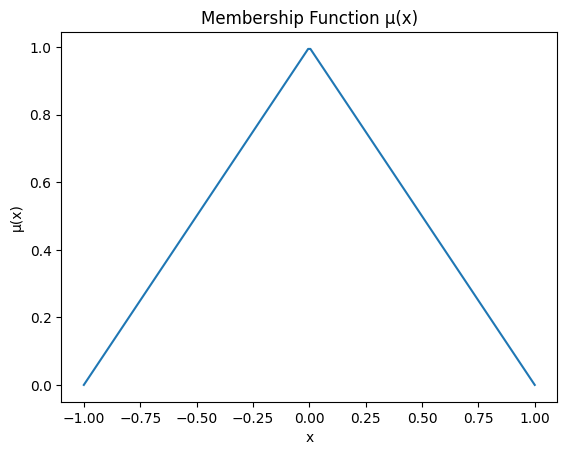

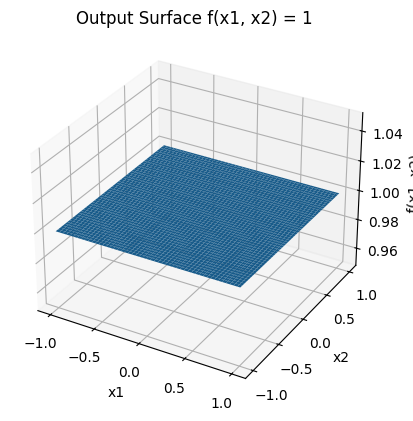

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define domain and membership function
x = np.linspace(-1, 1, 200)
mu = np.maximum(0, 1 - np.abs(x))

# Plot membership function μ(x)
plt.figure()
plt.plot(x, mu)
plt.xlabel('x')
plt.ylabel('μ(x)')
plt.title('Membership Function μ(x)')
plt.show()

# Plot 3D output surface f(x1, x2) = 1
X1, X2 = np.meshgrid(x, x)
Z = np.ones_like(X1)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X1, X2, Z)
ax.set_xlabel('x1')
ax.set_ylabel('x2')
ax.set_zlabel('f(x1, x2)')
ax.set_title('Output Surface f(x1, x2) = 1')
plt.show()


# پرسش شش

In [ ]:
!pip install scikit-fuzzy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 11.5 MB/s eta 0:00:00


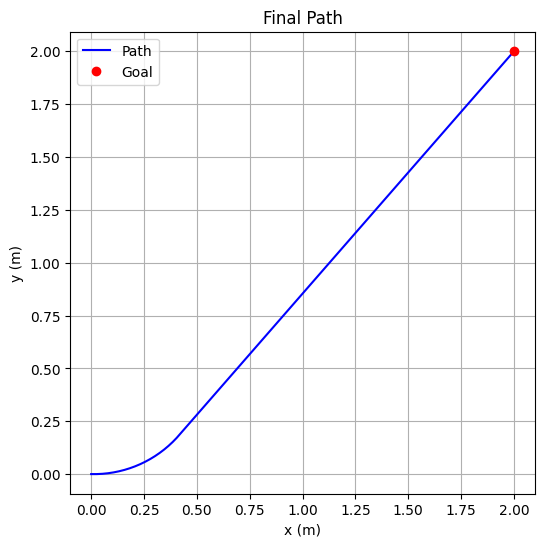

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
import skfuzzy as fuzz
from skfuzzy import control as ctrl
from IPython.display import HTML

# Define fuzzy variables
e_theta = ctrl.Antecedent(np.linspace(-np.pi, np.pi, 100), 'e_theta')
ed = ctrl.Antecedent(np.linspace(0, 5, 100), 'ed')
omega = ctrl.Consequent(np.linspace(-1, 1, 100), 'omega')
v = ctrl.Consequent(np.linspace(0, 0.5, 100), 'v')

# Membership functions
e_theta['NL'] = fuzz.trimf(e_theta.universe, [-np.pi, -np.pi, -np.pi/2])
e_theta['NS'] = fuzz.trimf(e_theta.universe, [-np.pi, -np.pi/2, 0])
e_theta['Z'] = fuzz.trimf(e_theta.universe, [-0.2, 0, 0.2])
e_theta['PS'] = fuzz.trimf(e_theta.universe, [0, np.pi/2, np.pi])
e_theta['PL'] = fuzz.trimf(e_theta.universe, [np.pi/2, np.pi, np.pi])

ed['Near'] = fuzz.trimf(ed.universe, [0, 0, 1.5])
ed['Medium'] = fuzz.trimf(ed.universe, [1, 2.5, 4])
ed['Far'] = fuzz.trimf(ed.universe, [3.5, 5, 5])

omega['TSL'] = fuzz.trimf(omega.universe, [-1, -1, -0.5])
omega['TL'] = fuzz.trimf(omega.universe, [-1, -0.5, 0])
omega['NT'] = fuzz.trimf(omega.universe, [-0.1, 0, 0.1])
omega['TR'] = fuzz.trimf(omega.universe, [0, 0.5, 1])
omega['TSR'] = fuzz.trimf(omega.universe, [0.5, 1, 1])

v['Low'] = fuzz.trimf(v.universe, [0, 0, 0.2])
v['Medium'] = fuzz.trimf(v.universe, [0.1, 0.3, 0.4])
v['High'] = fuzz.trimf(v.universe, [0.3, 0.5, 0.5])

# Define rules
rules = [
    ctrl.Rule(e_theta['Z'] & ed['Far'], omega['NT']),
    ctrl.Rule(e_theta['PL'] & ed['Far'], omega['TSR']),
    ctrl.Rule(e_theta['NL'] & ed['Far'], omega['TSL']),
    ctrl.Rule(e_theta['NS'] & ed['Medium'], omega['TL']),
    ctrl.Rule(e_theta['PS'] & ed['Medium'], omega['TR']),
    ctrl.Rule(e_theta['Z'] & ed['Near'], omega['NT']),
    ctrl.Rule(e_theta['PL'] & ed['Near'], omega['TR']),
    ctrl.Rule(e_theta['NL'] & ed['Near'], omega['TL']),
    ctrl.Rule(ed['Far'], v['High']),
    ctrl.Rule(ed['Medium'], v['Medium']),
    ctrl.Rule(ed['Near'], v['Low']),
]

# Build controller
control_system = ctrl.ControlSystem(rules)
sim = ctrl.ControlSystemSimulation(control_system)

# Simulation setup
x, y, theta = 0.0, 0.0, 0.0
xg, yg, thetag = 2.0, 2.0, np.pi / 2 + 1.57
dt = 0.1
tolerance_dist = 0.01
tolerance_theta = 0.1

trajectory = [(x, y)]
v_list = []
omega_list = []
e_list = []
etheta_list = []
theta_list = [theta]

# Simulation loop
for _ in range(300):
    dx = xg - x
    dy = yg - y
    dist = np.hypot(dx, dy)
    desired_theta = np.arctan2(dy, dx)
    e_th = np.arctan2(np.sin(desired_theta - theta), np.cos(desired_theta - theta))

    sim.input['e_theta'] = e_th
    sim.input['ed'] = dist
    sim.compute()

    v_out = sim.output.get('v', 0)
    omega_out = sim.output.get('omega', 0)

    if dist < tolerance_dist:
        desired_theta = thetag
        e_th = np.arctan2(np.sin(thetag - theta), np.cos(thetag - theta))
        sim.input['e_theta'] = e_th
        sim.input['ed'] = 0.01  # avoid full zero
        sim.compute()
        v_out = 0
        omega_out = sim.output.get('omega', 0)
        if abs(e_th) < tolerance_theta:
            break

    v_list.append(v_out)
    omega_list.append(omega_out)
    e_list.append(dist)
    etheta_list.append(e_th)

    x += v_out * np.cos(theta) * dt
    y += v_out * np.sin(theta) * dt
    theta += omega_out * dt
    theta = np.arctan2(np.sin(theta), np.cos(theta))  # normalize

    trajectory.append((x, y))
    theta_list.append(theta)

trajectory = np.array(trajectory)



# Final trajectory plot
plt.figure(figsize=(6, 6))
plt.plot(trajectory[:, 0], trajectory[:, 1], 'b-', label='Path')
plt.plot(xg, yg, 'ro', label='Goal')
plt.xlabel('x (m)')
plt.ylabel('y (m)')
plt.legend()
plt.title('Final Path')
plt.axis('equal')
plt.grid(True)
plt.show()

# Animation setup
fig, ax = plt.subplots(figsize=(6, 6))
ax.set_xlim(-1, 3)
ax.set_ylim(-1, 3)
ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
ax.set_title("Robot Animation")
robot_dot, = ax.plot([], [], 'bo', label="Robot")
path_line, = ax.plot([], [], 'b--', alpha=0.5)
goal_dot, = ax.plot(xg, yg, 'ro', label="Goal")
text_v = ax.text(0.02, 0.95, '', transform=ax.transAxes)
text_omega = ax.text(0.02, 0.90, '', transform=ax.transAxes)
text_pos = ax.text(0.02, 0.85, '', transform=ax.transAxes)
text_theta = ax.text(0.02, 0.80, '', transform=ax.transAxes)

def init():
    robot_dot.set_data([], [])
    path_line.set_data([], [])
    text_v.set_text('')
    text_omega.set_text('')
    text_pos.set_text('')
    text_theta.set_text('')
    return robot_dot, path_line, text_v, text_omega, text_pos, text_theta

def update(frame):
    robot_dot.set_data([trajectory[frame, 0]], [trajectory[frame, 1]])
    path_line.set_data(trajectory[:frame+1, 0], trajectory[:frame+1, 1])
    text_v.set_text(f'v = {v_list[frame]:.2f} m/s')
    text_omega.set_text(f'ω = {omega_list[frame]:.2f} rad/s')
    text_pos.set_text(f'pos = ({trajectory[frame,0]:.2f}, {trajectory[frame,1]:.2f})')
    text_theta.set_text(f'θ = {theta_list[frame]:.2f} rad')
    return robot_dot, path_line, text_v, text_omega, text_pos, text_theta

ani = animation.FuncAnimation(fig, update, frames=len(v_list),
                              init_func=init, blit=True)

plt.legend()
plt.close()
HTML(ani.to_jshtml())


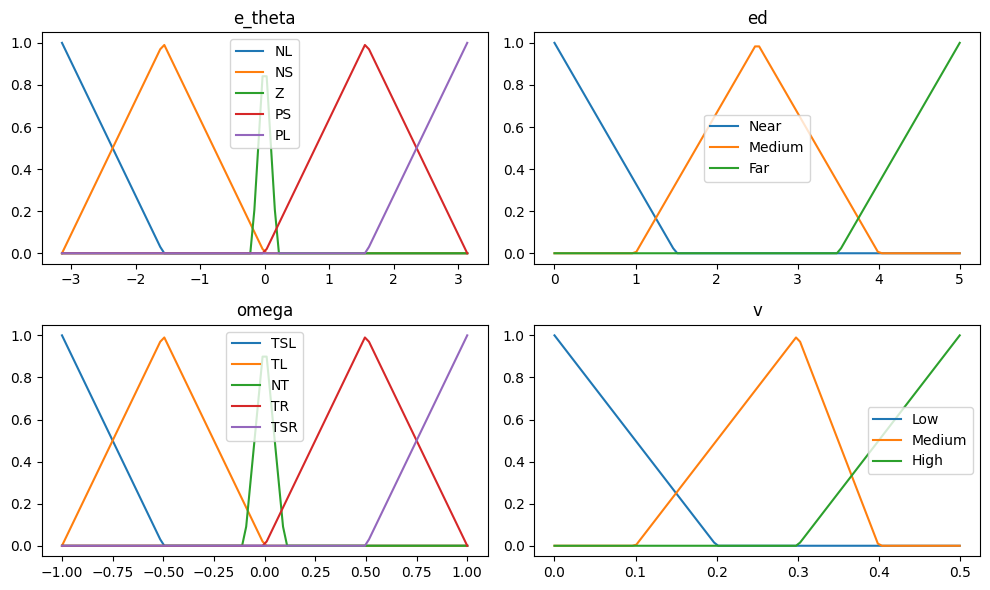

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(10, 6))

for label in e_theta.terms:
    mf = e_theta[label].mf
    axs[0, 0].plot(e_theta.universe, mf, label=label)
axs[0, 0].set_title('e_theta')
axs[0, 0].legend()

for label in ed.terms:
    mf = ed[label].mf
    axs[0, 1].plot(ed.universe, mf, label=label)
axs[0, 1].set_title('ed')
axs[0, 1].legend()

for label in omega.terms:
    mf = omega[label].mf
    axs[1, 0].plot(omega.universe, mf, label=label)
axs[1, 0].set_title('omega')
axs[1, 0].legend()

for label in v.terms:
    mf = v[label].mf
    axs[1, 1].plot(v.universe, mf, label=label)
axs[1, 1].set_title('v')
axs[1, 1].legend()

plt.tight_layout()
plt.show()



# پرسش هفت ✅

In [ ]:
% Load and preprocess data
data = readtable('C:\Users\USER\Downloads\diabetes.csv');
X = table2array(data(:, 1:end-1));
Y = table2array(data(:, end));
X = normalize(X, 'range');

% Train/test split
cv = cvpartition(size(X,1), 'HoldOut', 0.3);
idx = cv.test;

XTrain = X(~idx, :)';
YTrain = Y(~idx)';
XTest = X(idx, :)';
YTest = Y(idx)';

% Convert labels to categorical target for MLP
YTrain_categorical = full(ind2vec(YTrain + 1)); % classes: 1 and 2

% Define and train MLP
net = patternnet([8 10]);
net.trainFcn = 'trainlm';
net.performFcn = 'crossentropy';

net.divideParam.trainRatio = 0.8;
net.divideParam.valRatio = 0.2;
net.divideParam.testRatio = 0.0;

[net, tr] = train(net, XTrain, YTrain_categorical);

% Predict on test data
YTest_output = net(XTest);
YTest_pred = vec2ind(YTest_output) - 1;

% Accuracy
accuracy = sum(YTest_pred == YTest) / length(YTest);
fprintf('MLP Accuracy: %.2f%%\n', accuracy * 100);



ANFIS:

In [ ]:
data = readtable('C:\Users\USER\Downloads\diabetes.csv');
X = table2array(data(:, 1:end-1));
Y = table2array(data(:, end));

%X = normalize(X, 'range');

cv = cvpartition(size(X,1), 'HoldOut', 0.3);
idx = cv.test;
XTrain = X(~idx, :);
YTrain = Y(~idx, :);
XTest = X(idx, :);
YTest = Y(idx, :);

fis2 = genfis2(XTrain, YTrain, 0.4);

epoch_n = 50;
anfis_model2 = anfis([XTrain YTrain], fis2, epoch_n);

yPred2 = evalfis(XTest, anfis_model2);
yPred2 = round(yPred2);
accuracy2 = sum(yPred2 == YTest) / length(YTest);
fprintf('ANFIS (genfis2) Accuracy: %.2f%%\n', accuracy2 * 100);

anfis_model2 = anfis([XTrain YTrain], fis2, epoch_n);
showrule(anfis_model2)

rules = fis2.Rules;
nRules = numel(rules);
nInputs = numel(fis2.Inputs);
r = 1
    figure('Name', ['Rule ' num2str(r)]);
    for i = 1:nInputs
        mfIndex = rules(r).Antecedent(i);
        mf = fis2.Inputs(i).MembershipFunctions(mfIndex);
        subplot(2, ceil(nInputs/2), i)
        plotmf(fis2, 'input', i)
        title(sprintf('Input %d - MF: %s', i, mf.Name))
        hold on
    end

input_names = {'Pregnancies', 'Glucose', 'BloodPressure', ...
               'SkinThickness', 'Insulin', 'BMI', ...
               'DiabetesPedigreeFunction', 'Age'};

mf_labels = {'Low', 'Medium', 'High'};

rules = anfis_model2.rule;
numRules = length(rules);

fprintf('\n======= ANFIS Extracted Rules =======\n\n');

for i = 1:numRules
    rule = rules(i);
    str = sprintf('Rule %d: IF ', i);

    for j = 1:length(rule.antecedent)
        mf_index = rule.antecedent(j);
        if mf_index == 0
            continue;
        end
        if mf_index > length(mf_labels)
            mf_text = sprintf('MF%d', mf_index);
        else
            mf_text = mf_labels{mf_index};
        end
        str = [str, sprintf('(%s is %s)', input_names{j}, mf_text)];
        if j < length(rule.antecedent)
            str = [str, ' AND '];
        end
    end

    output_value = rule.consequent;
    if output_value == 1
        out_text = 'No Diabetes';
    else
        out_text = 'Diabetes';
    end

    str = [str, sprintf(' THEN Output is %s\n', out_text)];
    fprintf('%s', str);
end



